In [1]:
import pandas as pd
import numpy as np
import os
import glob
import matplotlib.pyplot as plt
from Summary_Project import analysis, results
import seaborn as sns
import matplotlib as mpl
from matplotlib.cm import ScalarMappable 
from matplotlib.lines import Line2D 
import matplotlib.patches as mpatches 
from matplotlib.patches import Patch
from textwrap import wrap 
from mpl_toolkits.axes_grid1.inset_locator import inset_axes 
from skbio.diversity import beta_diversity, alpha
from scipy.stats import linregress
import logging
logging.getLogger('matplotlib').setLevel(logging.ERROR)

sum of patients from cohorts (not TS): 1715
#########################################################
sum of patients from Time series (TS) cohorts: 2736


For chacked by normalize biological variable, 2 (A & B) samples from the same cohort (21 protocols) share the same demographic information.

In [2]:
Taxa = pd.read_csv("/data1/Oded.Sabah/metaanalysis/biology_variable/Sample_output_bio/PRJEB14847/species_abundance/PRJEB14847_species_abundance.csv")
Indicate_samples = pd.read_csv("/home/odeds/metaanalysis/Rarefaction/Code/CALCULATE_THRESHOLD/biology_variable/Samples/read-sample.csv")

In [3]:
summary_sample = Indicate_samples[["sample_accession", "sample_gro","Lab", "read_count", "base_count"]]
def q1(x):
    return x.quantile(0.25)
def q3(x):
    return x.quantile(0.75)
summray_read_count = summary_sample.groupby('sample_gro')['read_count'].agg(median='median', Q1=q1, Q3=q3)
print(summray_read_count)

                median           Q1           Q3
sample_gro                                      
A           27882484.5  26821144.75  29482116.75
B           28469684.0  26742964.00  30403658.00


In [4]:
Indicate_samples = Indicate_samples[["sample_accession", "sample_gro","Lab"]]
Indicate_samples.set_index("sample_accession", inplace = True)
Indicate_samples.sample_gro.value_counts()

sample_gro
B    21
A    20
Name: count, dtype: int64

In [5]:
def process_taxa(df, prefix):
    result = df.loc[:, df.columns.str.startswith(prefix)].fillna(0)
    return result.loc[:, (result != 0).any(axis=0)]

Taxa = Taxa.T
Taxa.columns = Taxa.iloc[0]
Taxa = Taxa[1:].fillna(0)
Taxa = pd.concat([Indicate_samples, Taxa], axis =1)

condition = (Taxa['Lab'] != "10") & (Taxa['sample_gro'] == "A")
first_row_index = Taxa[condition].index[0] if not Taxa[condition].empty else None

A = Taxa[Taxa['sample_gro'] == "A"]
B = Taxa[Taxa['sample_gro'] == "B"]

In [6]:
df_list = [("A", A), ("B", B)]

In [7]:
analysis.compute_alpha_diversities(df_list, 'g', 0.1)


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

A v.s. B: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.992e-05 U_stat=3.680e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

A v.s. B: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.252e-07 U_stat=4.130e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

A v.s. B: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.074e-04 U_stat=3.590e+02


(                 A         B
 median    5.299043  4.802870
 q1        5.115365  4.640392
 q3        5.401479  4.924112
 max_diff  1.360340  1.176669,
              A     B
 median    87.5  66.0
 q1        82.5  64.0
 q3        92.0  70.0
 max_diff  30.0  37.0,
                  A         B
 median    0.959051  0.941286
 q1        0.954321  0.922410
 q3        0.962864  0.946697
 max_diff  0.090072  0.058252)

In [8]:
analysis.compute_alpha_diversities(df_list, 's', 0.1)

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

A v.s. B: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.711e-06 U_stat=3.820e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

A v.s. B: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.787e-07 U_stat=4.020e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

A v.s. B: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.708e-06 U_stat=3.810e+02


(                 A         B
 median    5.880407  5.338879
 q1        5.709219  5.093489
 q3        6.042071  5.508164
 max_diff  1.279163  1.281588,
                A      B
 median    130.00   98.0
 q1        110.50   92.0
 q3        133.25  103.0
 max_diff   48.00   47.0,
                  A         B
 median    0.968171  0.955724
 q1        0.966044  0.936438
 q3        0.972891  0.959807
 max_diff  0.044747  0.041505)

                 A         B
median    0.356823  0.372738
q1        0.229295  0.258873
q3        0.467140  0.522224
max_diff  0.717180  0.689396
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

A v.s. B: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.506e-02 U_stat=1.802e+04


,A,B
A,0.36,0.56
B,0.56,0.37


,A,B
A,0.36,0.56
B,0.56,0.37


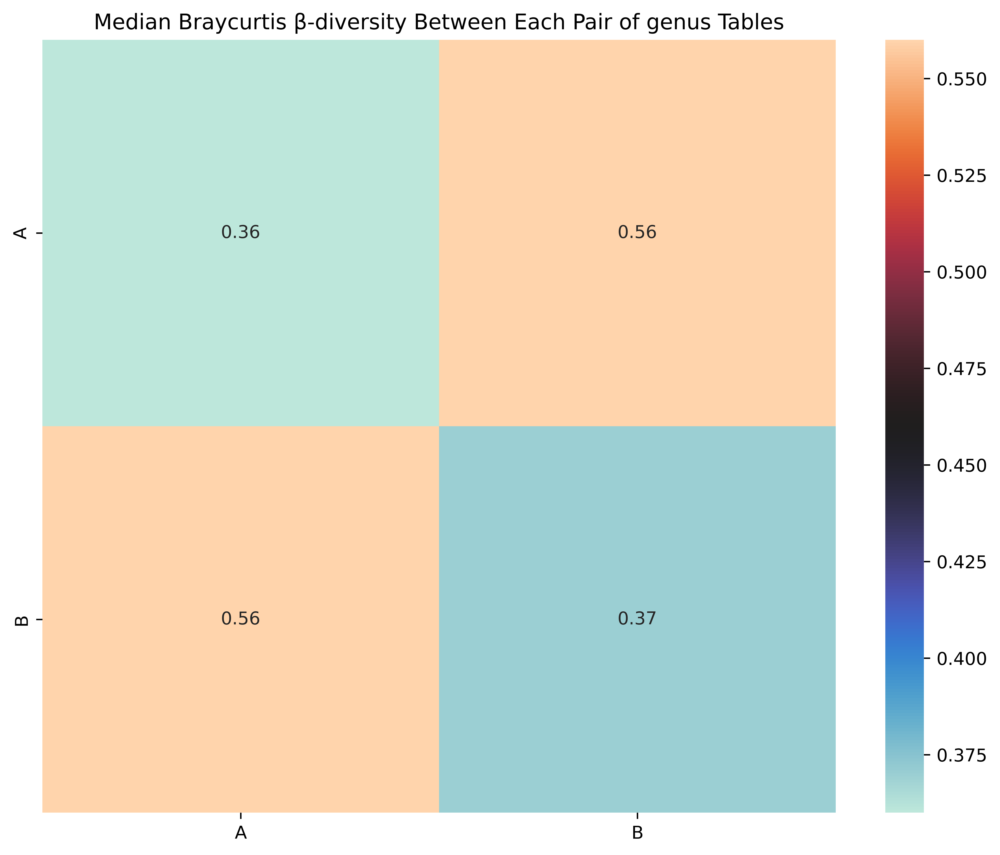

{'A': 0.35682301061185967, 'B': 0.37273788529365715}

In [9]:
analysis.compute_median_diversities(df_list, "braycurtis", "g", 0.1)

                 A         B
median    0.378576  0.392352
q1        0.253900  0.275314
q3        0.500286  0.544633
max_diff  0.721275  0.718763
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

A v.s. B: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.465e-01 U_stat=1.827e+04


,A,B
A,0.38,0.71
B,0.71,0.39


,A,B
A,0.38,0.71
B,0.71,0.39


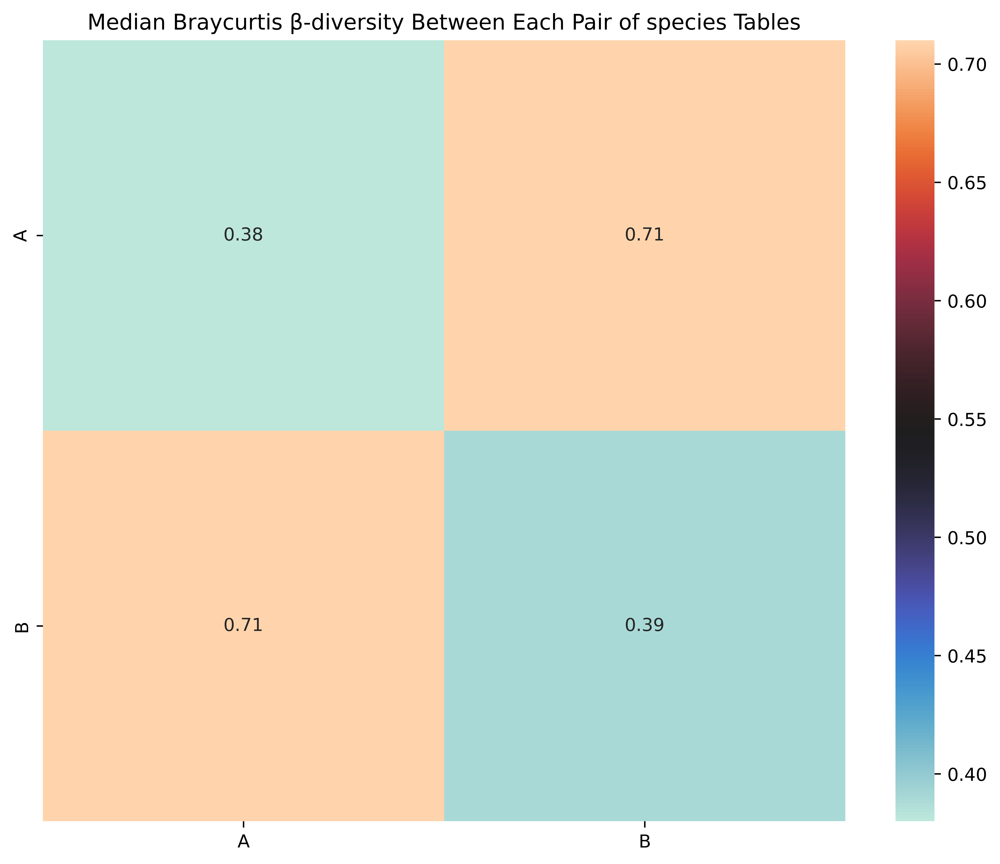

{'A': 0.3785759491069184, 'B': 0.3923519979434956}

In [10]:
analysis.compute_median_diversities(df_list, "braycurtis", "s", 0.1)

                 A         B
median    0.645959  0.655034
q1        0.562256  0.550521
q3        0.740476  0.719487
max_diff  0.653689  0.552456
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

A v.s. B: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.444e-01 U_stat=2.083e+04


,A,B
A,0.65,0.38
B,0.38,0.66


,A,B
A,0.65,0.38
B,0.38,0.66


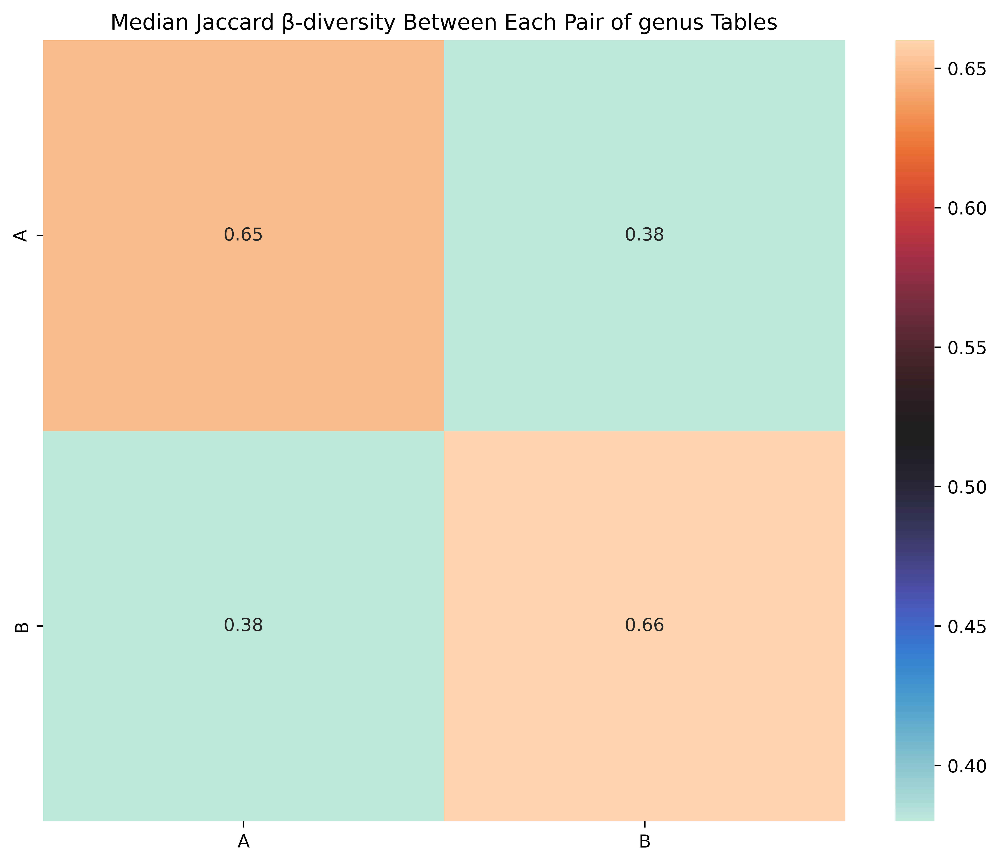

{'A': 0.645959318306762, 'B': 0.6550343249427918}

In [11]:
analysis.compute_median_diversities(df_list, "jaccard", "g", 0.1)

                 A         B
median    0.608716  0.593414
q1        0.506007  0.488919
q3        0.716400  0.708333
max_diff  0.718863  0.586386
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

A v.s. B: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.450e-01 U_stat=2.083e+04


,A,B
A,0.61,0.21
B,0.21,0.59


,A,B
A,0.61,0.21
B,0.21,0.59


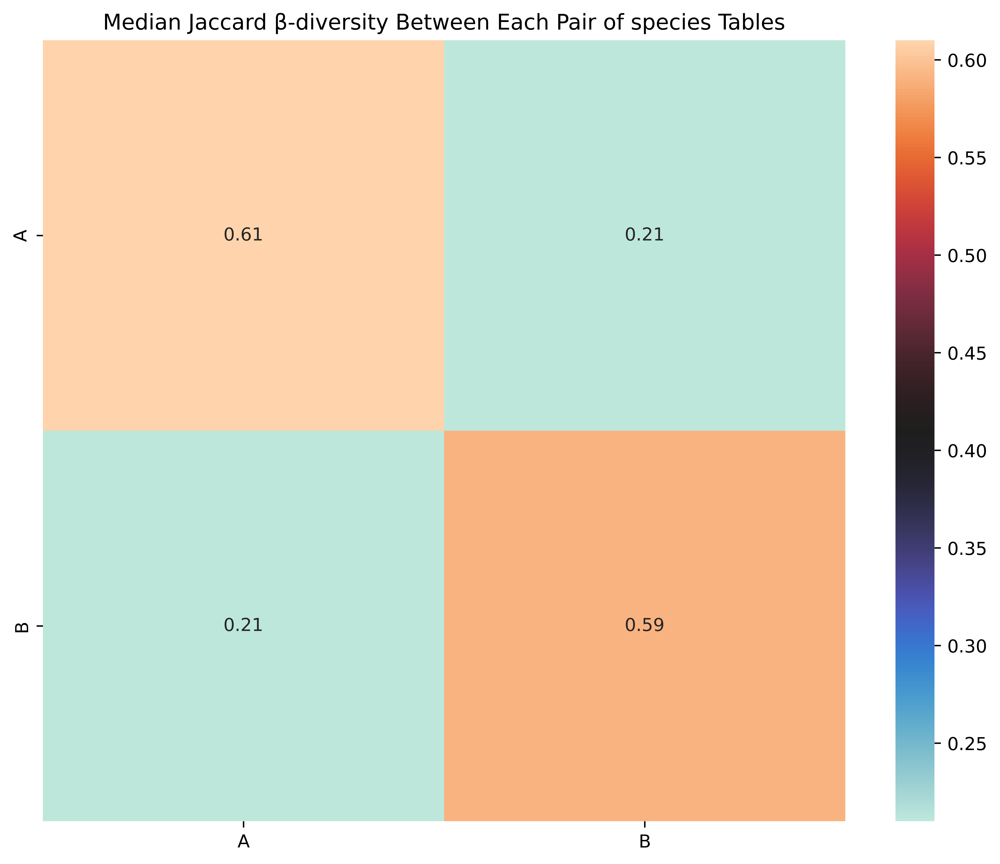

{'A': 0.6087160891753962, 'B': 0.5934138021516662}

In [12]:
analysis.compute_median_diversities(df_list, "jaccard", "s", 0.1)

In [ ]:
a_labs_dataframes = {} 
b_labs_dataframes = {}

for lab in A['Lab'].unique():
    a_labs_dataframes[f'A_{lab}'] = A[(A['sample_gro'] == "A") & (A['Lab'] == lab)]
for lab in B['Lab'].unique():    
    b_labs_dataframes[f'B_{lab}'] = B[(B['sample_gro'] == "B") & (B['Lab'] == lab)]

df_list_a = [(label, df) for label, df in a_labs_dataframes.items()]
df_list_b = [(label, df) for label, df in b_labs_dataframes.items()]

In [ ]:
analysis.compute_alpha_diversities(df_list_a, 'g', 0.1)

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

A_1 v.s. A_2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_2 v.s. A_3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_3 v.s. A_4: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_4 v.s. A_5: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_5 v.s. A_6: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_6 v.s. A_7: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_7 v.s. A_8: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_8 v.s. A_9: Mann-Whitney-Wilcoxon test two-sided w

A_2 v.s. A_7: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_3 v.s. A_8: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_4 v.s. A_9: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_5 v.s. A_11: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_6 v.s. A_12: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_7 v.s. A_13: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_8 v.s. A_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_9 v.s. A_15: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_11 v.s. A_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_

A_11 v.s. A_21: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_1 v.s. A_13: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_2 v.s. A_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_3 v.s. A_15: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_4 v.s. A_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_5 v.s. A_17: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_6 v.s. A_18: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_7 v.s. A_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_8 v.s. A_20: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00

A_8 v.s. A_11: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_9 v.s. A_12: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_11 v.s. A_13: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_12 v.s. A_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_13 v.s. A_15: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.000e-01
A_14 v.s. A_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_15 v.s. A_17: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_16 v.s. A_18: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_17 v.s. A_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.0

A_1 v.s. A_8: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_2 v.s. A_9: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_3 v.s. A_11: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.000e-01
A_4 v.s. A_12: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_5 v.s. A_13: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_6 v.s. A_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_7 v.s. A_15: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_8 v.s. A_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_9 v.s. A_17: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_

A_4 v.s. A_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_5 v.s. A_20: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_6 v.s. A_21: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_1 v.s. A_17: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_2 v.s. A_18: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_3 v.s. A_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_4 v.s. A_20: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_5 v.s. A_21: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_1 v.s. A_18: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 

A_1 v.s. A_5: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_2 v.s. A_6: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_3 v.s. A_7: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_4 v.s. A_8: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_5 v.s. A_9: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_6 v.s. A_11: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_7 v.s. A_12: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_8 v.s. A_13: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_9 v.s. A_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_sta

A_4 v.s. A_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_5 v.s. A_15: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_6 v.s. A_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_7 v.s. A_17: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_8 v.s. A_18: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_9 v.s. A_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_11 v.s. A_20: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_12 v.s. A_21: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_1 v.s. A_12: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+0

In [ ]:
analysis.compute_alpha_diversities(df_list_a, 's', 0.1)

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

A_1 v.s. A_2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_2 v.s. A_3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_3 v.s. A_4: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_4 v.s. A_5: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_5 v.s. A_6: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_6 v.s. A_7: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_7 v.s. A_8: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_8 v.s. A_9: Mann-Whitney-Wilcoxon test two-sided w

A_2 v.s. A_7: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_3 v.s. A_8: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_4 v.s. A_9: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_5 v.s. A_11: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_6 v.s. A_12: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_7 v.s. A_13: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_8 v.s. A_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_9 v.s. A_15: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_11 v.s. A_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_

A_11 v.s. A_21: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_1 v.s. A_13: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_2 v.s. A_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_3 v.s. A_15: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_4 v.s. A_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_5 v.s. A_17: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_6 v.s. A_18: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_7 v.s. A_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_8 v.s. A_20: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00

A_8 v.s. A_11: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_9 v.s. A_12: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_11 v.s. A_13: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_12 v.s. A_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_13 v.s. A_15: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_14 v.s. A_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_15 v.s. A_17: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_16 v.s. A_18: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_17 v.s. A_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.0

A_1 v.s. A_8: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_2 v.s. A_9: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_3 v.s. A_11: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_4 v.s. A_12: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_5 v.s. A_13: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_6 v.s. A_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_7 v.s. A_15: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_8 v.s. A_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_9 v.s. A_17: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_

A_4 v.s. A_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_5 v.s. A_20: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_6 v.s. A_21: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_1 v.s. A_17: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.000e-01
A_2 v.s. A_18: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_3 v.s. A_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_4 v.s. A_20: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_5 v.s. A_21: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_1 v.s. A_18: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 

A_1 v.s. A_5: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_2 v.s. A_6: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_3 v.s. A_7: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_4 v.s. A_8: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_5 v.s. A_9: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_6 v.s. A_11: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_7 v.s. A_12: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_8 v.s. A_13: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_9 v.s. A_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_sta

A_4 v.s. A_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_5 v.s. A_15: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_6 v.s. A_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_7 v.s. A_17: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_8 v.s. A_18: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_9 v.s. A_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
A_11 v.s. A_20: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_12 v.s. A_21: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
A_1 v.s. A_12: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+0

In [ ]:
analysis.compute_alpha_diversities(df_list_b, 'g', 0.1)

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

B_1 v.s. B_2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_2 v.s. B_3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_3 v.s. B_4: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_4 v.s. B_5: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_5 v.s. B_6: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_6 v.s. B_7: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_7 v.s. B_8: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_8 v.s. B_9: Mann-Whitney-Wilcoxon test two-sided w

B_15 v.s. B_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_16 v.s. B_20: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_17 v.s. B_21: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_1 v.s. B_6: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_2 v.s. B_7: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_3 v.s. B_8: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_4 v.s. B_9: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_5 v.s. B_10: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_6 v.s. B_11: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U

B_1 v.s. B_11: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_2 v.s. B_12: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_3 v.s. B_13: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_4 v.s. B_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_5 v.s. B_15: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_6 v.s. B_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_7 v.s. B_17: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_8 v.s. B_18: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_9 v.s. B_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 

B_7 v.s. B_8: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_8 v.s. B_9: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_9 v.s. B_10: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_10 v.s. B_11: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_11 v.s. B_12: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_12 v.s. B_13: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_13 v.s. B_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_14 v.s. B_15: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.000e-01
B_15 v.s. B_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e

B_6 v.s. B_11: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_7 v.s. B_12: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_8 v.s. B_13: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_9 v.s. B_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_10 v.s. B_15: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_11 v.s. B_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_12 v.s. B_17: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_13 v.s. B_18: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_14 v.s. B_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000

B_9 v.s. B_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_10 v.s. B_20: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_11 v.s. B_21: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_1 v.s. B_12: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_2 v.s. B_13: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.000e-01
B_3 v.s. B_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_4 v.s. B_15: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_5 v.s. B_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_6 v.s. B_17: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+0

B_15 v.s. B_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_16 v.s. B_17: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_17 v.s. B_18: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_18 v.s. B_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_19 v.s. B_20: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_20 v.s. B_21: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_1 v.s. B_3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_2 v.s. B_4: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_3 v.s. B_5: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+

B_14 v.s. B_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_15 v.s. B_20: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_16 v.s. B_21: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_1 v.s. B_7: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_2 v.s. B_8: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_3 v.s. B_9: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_4 v.s. B_10: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_5 v.s. B_11: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_6 v.s. B_12: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 

B_6 v.s. B_17: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_7 v.s. B_18: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_8 v.s. B_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_9 v.s. B_20: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_10 v.s. B_21: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_1 v.s. B_13: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_2 v.s. B_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_3 v.s. B_15: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_4 v.s. B_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00

In [ ]:
analysis.compute_alpha_diversities(df_list_b, 's', 0.1)

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

B_1 v.s. B_2: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_2 v.s. B_3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_3 v.s. B_4: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_4 v.s. B_5: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_5 v.s. B_6: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_6 v.s. B_7: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_7 v.s. B_8: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_8 v.s. B_9: Mann-Whitney-Wilcoxon test two-sided w

B_15 v.s. B_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_16 v.s. B_20: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_17 v.s. B_21: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_1 v.s. B_6: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_2 v.s. B_7: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_3 v.s. B_8: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_4 v.s. B_9: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_5 v.s. B_10: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_6 v.s. B_11: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U

B_1 v.s. B_11: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_2 v.s. B_12: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_3 v.s. B_13: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_4 v.s. B_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_5 v.s. B_15: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_6 v.s. B_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_7 v.s. B_17: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_8 v.s. B_18: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_9 v.s. B_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 

B_7 v.s. B_8: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_8 v.s. B_9: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_9 v.s. B_10: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_10 v.s. B_11: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_11 v.s. B_12: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_12 v.s. B_13: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_13 v.s. B_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_14 v.s. B_15: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_15 v.s. B_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e

B_6 v.s. B_11: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_7 v.s. B_12: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_8 v.s. B_13: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_9 v.s. B_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_10 v.s. B_15: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_11 v.s. B_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_12 v.s. B_17: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_13 v.s. B_18: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_14 v.s. B_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000

B_9 v.s. B_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_10 v.s. B_20: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_11 v.s. B_21: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_1 v.s. B_12: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_2 v.s. B_13: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_3 v.s. B_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_4 v.s. B_15: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_5 v.s. B_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_6 v.s. B_17: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+0

B_15 v.s. B_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_16 v.s. B_17: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_17 v.s. B_18: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_18 v.s. B_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_19 v.s. B_20: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_20 v.s. B_21: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_1 v.s. B_3: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_2 v.s. B_4: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_3 v.s. B_5: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+

B_14 v.s. B_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_15 v.s. B_20: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_16 v.s. B_21: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_1 v.s. B_7: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_2 v.s. B_8: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_3 v.s. B_9: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_4 v.s. B_10: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_5 v.s. B_11: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_6 v.s. B_12: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 

B_6 v.s. B_17: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_7 v.s. B_18: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_8 v.s. B_19: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_9 v.s. B_20: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.000e+00
B_10 v.s. B_21: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_1 v.s. B_13: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_2 v.s. B_14: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_3 v.s. B_15: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=0.000e+00
B_4 v.s. B_16: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00

In [ ]:
def compute_median_diversities(df_list, metric, TAXA_level, threshold):
    median_diversities = pd.DataFrame(np.zeros((len(df_list), len(df_list))), columns=[x[0] for x in df_list],
                                      index=[x[0] for x in df_list])

    for i in range(len(df_list)):
        for j in range(i + 1, len(df_list)):

            df_name_i, df_i = df_list[i]
            df_name_j, df_j = df_list[j]

            df_i = df_i.apply(pd.to_numeric, errors='coerce')
            df_i = df_i.where(df_i >= threshold)
            df_i = df_i.fillna(0)
            df_i = df_i.loc[:, (df_i != 0).any(axis=0)]
            df_i = df_i.sort_index(axis=1).astype(int)
            if TAXA_level == "g":
                df_i = df_i.loc[:, df_i.columns.str.startswith('g__')]
                data_i = df_i.values
            elif TAXA_level == "s":
                df_i = df_i.loc[:, df_i.columns.str.startswith('s__')]
                data_i = df_i.values

            df_j = df_j.apply(pd.to_numeric, errors='coerce')
            df_j = df_j.where(df_j >= threshold)
            df_j = df_j.fillna(0)
            df_j = df_j.loc[:, (df_j != 0).any(axis=0)]
            df_j = df_j.sort_index(axis=1).astype(int)
            if TAXA_level == "g":
                df_j = df_j.loc[:, df_j.columns.str.startswith('g__')]
                data_j = df_j.values
            elif TAXA_level == "s":
                df_j = df_j.loc[:, df_j.columns.str.startswith('s__')]
                data_j = df_j.values

            if metric == "jaccard":
                df_i = df_i.where(df_i == 0, 1)
                df_j = df_j.where(df_j == 0, 1)

            # Align the dataframes
            df_i, df_j = df_i.align(df_j, axis=1, fill_value=0)

            data_i = df_i.values
            data_j = df_j.values

            # Compute Bray-Curtis beta diversity
            dm_between = beta_diversity(metric, np.concatenate([data_i, data_j]),
                                        ids=[f"{df_name_i}_{id_}" for id_ in df_i.index]
                                            + [f"{df_name_j}_{id_}" for id_ in df_j.index])

            dm = pd.DataFrame(dm_between.data, index=dm_between.ids, columns=dm_between.ids)
            dm = dm.fillna(0)
            median_diversity = np.median(dm)
            median_diversities.loc[df_name_i, df_name_j] = median_diversity
            median_diversities.loc[df_name_j, df_name_i] = median_diversity
    if metric == "jaccard":
        median_diversities = 1 - median_diversities

    plt.figure(figsize=(10, 8), dpi=1200)

    if TAXA_level == 'g':
        taxa_label = 'genus'
    elif TAXA_level == 's':
        taxa_label = 'species'
    else:
        taxa_label = 'OTU'

    median_diversities_rounded = median_diversities.round(2)
    display(median_diversities_rounded)
    sns.clustermap(median_diversities_rounded, cmap=sns.color_palette("icefire", as_cmap=True), xticklabels=True, yticklabels=True)
    plt.title(f'Median {metric.capitalize()} β-diversity Between Each Pair of {taxa_label} Tables')
    plt.show()

In [ ]:
df_list = df_list_a + df_list_b

,A_1,A_2,A_3,A_4,A_5,A_6,A_7,A_8,A_9,A_11,...,B_12,B_13,B_14,B_15,B_16,B_17,B_18,B_19,B_20,B_21
A_1,0.00,0.06,0.24,0.11,0.20,0.21,0.17,0.24,0.24,0.19,...,0.35,0.32,0.35,0.37,0.30,0.30,0.35,0.30,0.33,0.29
A_2,0.06,0.00,0.25,0.08,0.18,0.19,0.12,0.23,0.23,0.17,...,0.35,0.30,0.33,0.34,0.29,0.30,0.33,0.28,0.33,0.26
A_3,0.24,0.25,0.00,0.23,0.36,0.34,0.32,0.36,0.38,0.17,...,0.27,0.37,0.39,0.42,0.28,0.32,0.39,0.32,0.28,0.28
A_4,0.11,0.08,0.23,0.00,0.19,0.16,0.14,0.25,0.23,0.18,...,0.35,0.29,0.31,0.33,0.29,0.31,0.30,0.28,0.32,0.26
A_5,0.20,0.18,0.36,0.19,0.00,0.11,0.10,0.21,0.13,0.31,...,0.40,0.26,0.27,0.29,0.33,0.32,0.28,0.31,0.41,0.32
A_6,0.21,0.19,0.34,0.16,0.11,0.00,0.09,0.22,0.12,0.31,...,0.39,0.23,0.22,0.24,0.32,0.32,0.24,0.30,0.39,0.31
A_7,0.17,0.12,0.32,0.14,0.10,0.09,0.00,0.22,0.16,0.26,...,0.37,0.23,0.24,0.26,0.31,0.30,0.24,0.27,0.37,0.29
A_8,0.24,0.23,0.36,0.25,0.21,0.22,0.22,0.00,0.20,0.34,...,0.32,0.28,0.31,0.32,0.35,0.31,0.31,0.28,0.41,0.34
A_9,0.24,0.23,0.38,0.23,0.13,0.12,0.16,0.20,0.00,0.35,...,0.37,0.24,0.26,0.25,0.35,0.33,0.26,0.30,0.41,0.33
A_11,0.19,0.17,0.17,0.18,0.31,0.31,0.26,0.34,0.35,0.00,...,0.35,0.38,0.40,0.41,0.29,0.36,0.40,0.35,0.31,0.29


<Figure size 12000x9600 with 0 Axes>

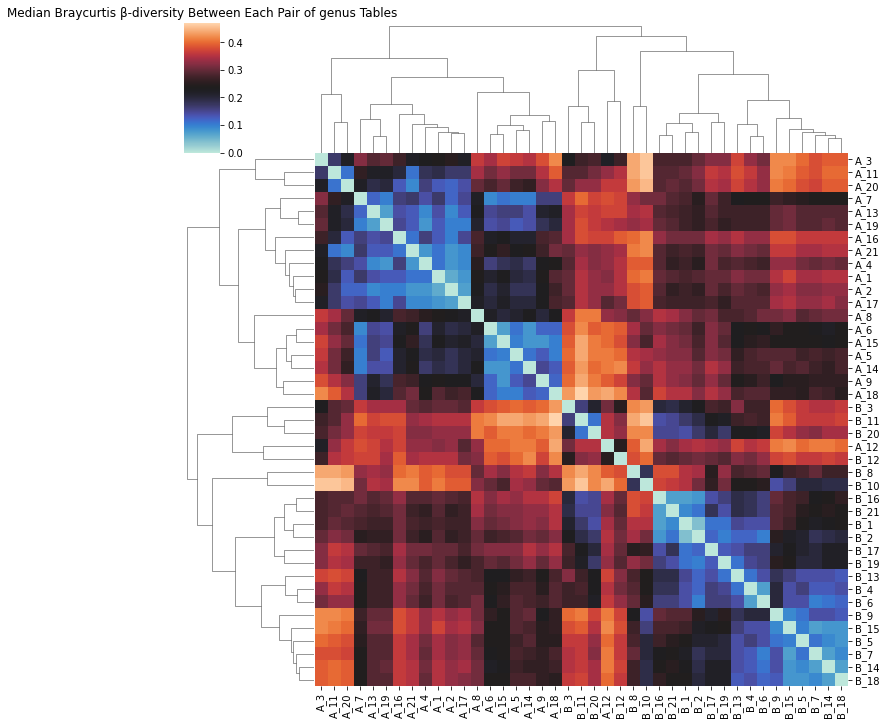

In [ ]:
compute_median_diversities(df_list, "braycurtis", "g", 0.1)

,A_1,A_2,A_3,A_4,A_5,A_6,A_7,A_8,A_9,A_11,...,B_12,B_13,B_14,B_15,B_16,B_17,B_18,B_19,B_20,B_21
A_1,0.00,0.07,0.28,0.15,0.18,0.22,0.17,0.28,0.23,0.22,...,0.44,0.41,0.43,0.43,0.40,0.41,0.42,0.40,0.42,0.39
A_2,0.07,0.00,0.28,0.11,0.19,0.21,0.13,0.27,0.26,0.21,...,0.42,0.39,0.41,0.41,0.38,0.40,0.40,0.38,0.41,0.35
A_3,0.28,0.28,0.00,0.26,0.38,0.37,0.34,0.38,0.40,0.19,...,0.43,0.46,0.46,0.47,0.40,0.43,0.46,0.41,0.40,0.40
A_4,0.15,0.11,0.26,0.00,0.21,0.18,0.14,0.26,0.24,0.20,...,0.43,0.38,0.40,0.40,0.38,0.41,0.38,0.38,0.41,0.36
A_5,0.18,0.19,0.38,0.21,0.00,0.14,0.12,0.24,0.16,0.33,...,0.42,0.35,0.35,0.35,0.38,0.38,0.36,0.37,0.46,0.39
A_6,0.22,0.21,0.37,0.18,0.14,0.00,0.13,0.26,0.16,0.35,...,0.42,0.35,0.33,0.34,0.38,0.40,0.35,0.39,0.45,0.40
A_7,0.17,0.13,0.34,0.14,0.12,0.13,0.00,0.24,0.19,0.27,...,0.40,0.33,0.33,0.34,0.36,0.36,0.34,0.35,0.43,0.37
A_8,0.28,0.27,0.38,0.26,0.24,0.26,0.24,0.00,0.22,0.35,...,0.37,0.35,0.37,0.37,0.39,0.35,0.37,0.33,0.44,0.40
A_9,0.23,0.26,0.40,0.24,0.16,0.16,0.19,0.22,0.00,0.38,...,0.40,0.35,0.34,0.34,0.40,0.38,0.35,0.37,0.46,0.42
A_11,0.22,0.21,0.19,0.20,0.33,0.35,0.27,0.35,0.38,0.00,...,0.45,0.47,0.47,0.47,0.39,0.45,0.47,0.42,0.41,0.39


<Figure size 12000x9600 with 0 Axes>

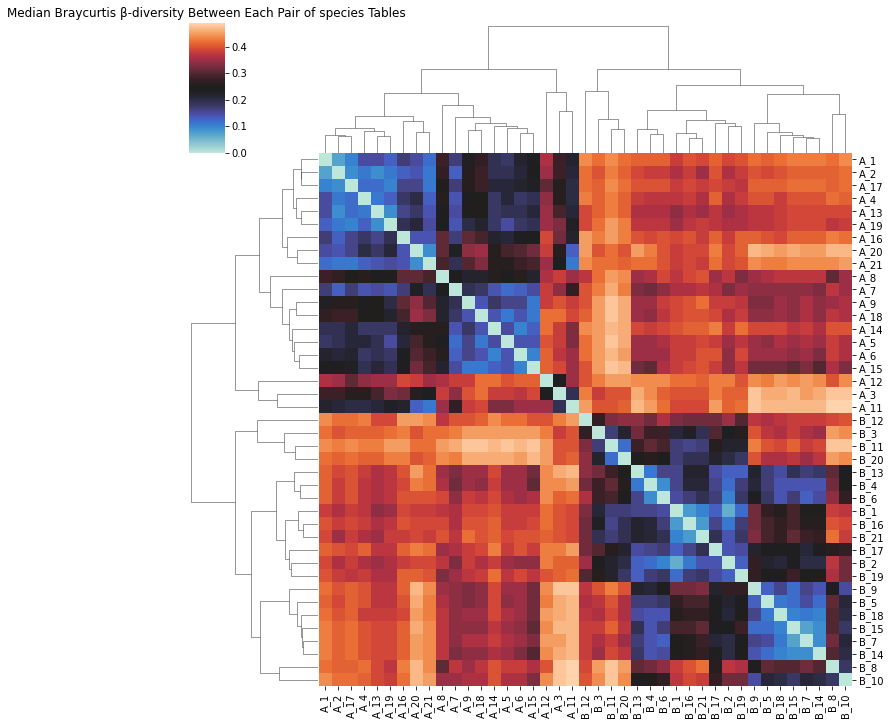

In [ ]:
compute_median_diversities(df_list, "braycurtis", "s", 0.1)

,A_1,A_2,A_3,A_4,A_5,A_6,A_7,A_8,A_9,A_11,...,B_12,B_13,B_14,B_15,B_16,B_17,B_18,B_19,B_20,B_21
A_1,1.00,0.90,0.71,0.85,0.80,0.79,0.81,0.74,0.79,0.80,...,0.61,0.68,0.65,0.66,0.68,0.69,0.67,0.67,0.64,0.67
A_2,0.90,1.00,0.68,0.93,0.87,0.86,0.88,0.76,0.83,0.78,...,0.60,0.70,0.67,0.68,0.68,0.69,0.69,0.70,0.62,0.69
A_3,0.71,0.68,1.00,0.68,0.66,0.65,0.66,0.62,0.65,0.79,...,0.62,0.61,0.61,0.59,0.66,0.65,0.60,0.63,0.65,0.65
A_4,0.85,0.93,0.68,1.00,0.86,0.88,0.90,0.75,0.82,0.77,...,0.59,0.71,0.68,0.70,0.67,0.68,0.70,0.69,0.62,0.68
A_5,0.80,0.87,0.66,0.86,1.00,0.91,0.91,0.77,0.89,0.73,...,0.58,0.73,0.70,0.71,0.67,0.68,0.72,0.69,0.62,0.68
A_6,0.79,0.86,0.65,0.88,0.91,1.00,0.93,0.76,0.91,0.73,...,0.58,0.72,0.69,0.71,0.65,0.66,0.71,0.66,0.61,0.66
A_7,0.81,0.88,0.66,0.90,0.91,0.93,1.00,0.73,0.84,0.74,...,0.58,0.74,0.71,0.72,0.68,0.69,0.73,0.69,0.63,0.69
A_8,0.74,0.76,0.62,0.75,0.77,0.76,0.73,1.00,0.76,0.68,...,0.58,0.66,0.61,0.63,0.62,0.63,0.63,0.66,0.57,0.63
A_9,0.79,0.83,0.65,0.82,0.89,0.91,0.84,0.76,1.00,0.75,...,0.59,0.72,0.71,0.73,0.66,0.67,0.73,0.68,0.61,0.67
A_11,0.80,0.78,0.79,0.77,0.73,0.73,0.74,0.68,0.75,1.00,...,0.64,0.63,0.60,0.62,0.67,0.66,0.62,0.64,0.64,0.66


<Figure size 12000x9600 with 0 Axes>

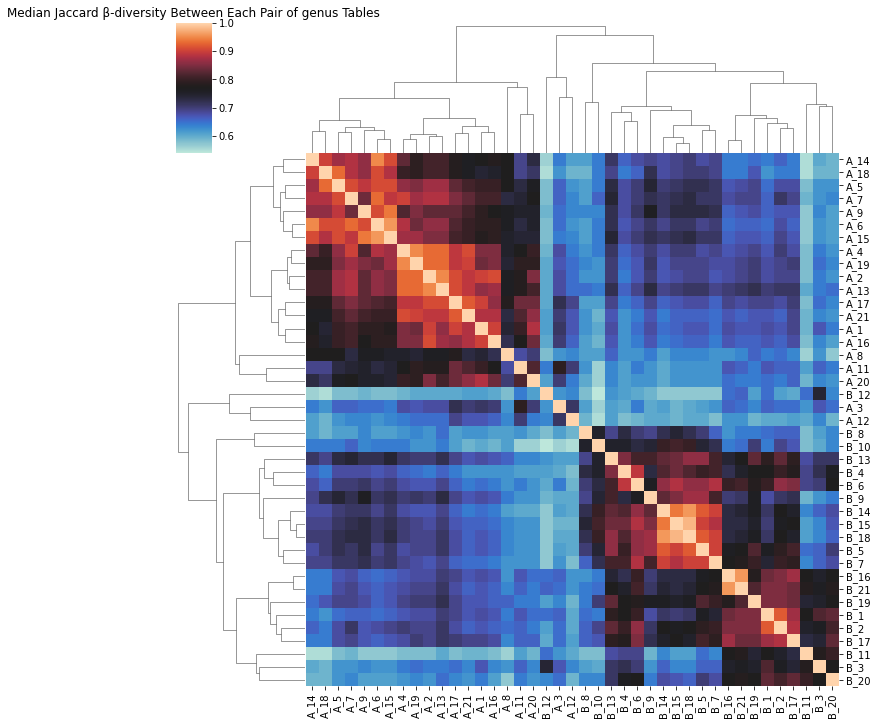

In [ ]:
compute_median_diversities(df_list, "jaccard", "g", 0.1)

,A_1,A_2,A_3,A_4,A_5,A_6,A_7,A_8,A_9,A_11,...,B_12,B_13,B_14,B_15,B_16,B_17,B_18,B_19,B_20,B_21
A_1,1.00,0.97,0.64,0.83,0.82,0.80,0.81,0.70,0.77,0.73,...,0.56,0.57,0.59,0.59,0.60,0.56,0.58,0.56,0.56,0.59
A_2,0.97,1.00,0.64,0.85,0.84,0.82,0.83,0.70,0.76,0.72,...,0.55,0.57,0.59,0.59,0.60,0.56,0.58,0.56,0.56,0.59
A_3,0.64,0.64,1.00,0.64,0.62,0.61,0.62,0.62,0.61,0.73,...,0.57,0.53,0.56,0.55,0.58,0.56,0.53,0.56,0.57,0.57
A_4,0.83,0.85,0.64,1.00,0.84,0.88,0.90,0.73,0.80,0.71,...,0.55,0.59,0.61,0.61,0.58,0.55,0.60,0.57,0.55,0.58
A_5,0.82,0.84,0.62,0.84,1.00,0.85,0.86,0.72,0.79,0.67,...,0.55,0.61,0.63,0.63,0.61,0.59,0.62,0.61,0.55,0.60
A_6,0.80,0.82,0.61,0.88,0.85,1.00,0.90,0.72,0.83,0.67,...,0.54,0.60,0.62,0.62,0.59,0.57,0.61,0.58,0.55,0.59
A_7,0.81,0.83,0.62,0.90,0.86,0.90,1.00,0.70,0.79,0.68,...,0.54,0.60,0.62,0.62,0.60,0.57,0.61,0.58,0.56,0.59
A_8,0.70,0.70,0.62,0.73,0.72,0.72,0.70,1.00,0.72,0.66,...,0.55,0.56,0.56,0.58,0.55,0.57,0.55,0.57,0.54,0.55
A_9,0.77,0.76,0.61,0.80,0.79,0.83,0.79,0.72,1.00,0.67,...,0.55,0.59,0.62,0.63,0.57,0.56,0.62,0.57,0.54,0.57
A_11,0.73,0.72,0.73,0.71,0.67,0.67,0.68,0.66,0.67,1.00,...,0.53,0.52,0.54,0.54,0.57,0.54,0.53,0.54,0.56,0.57


<Figure size 12000x9600 with 0 Axes>

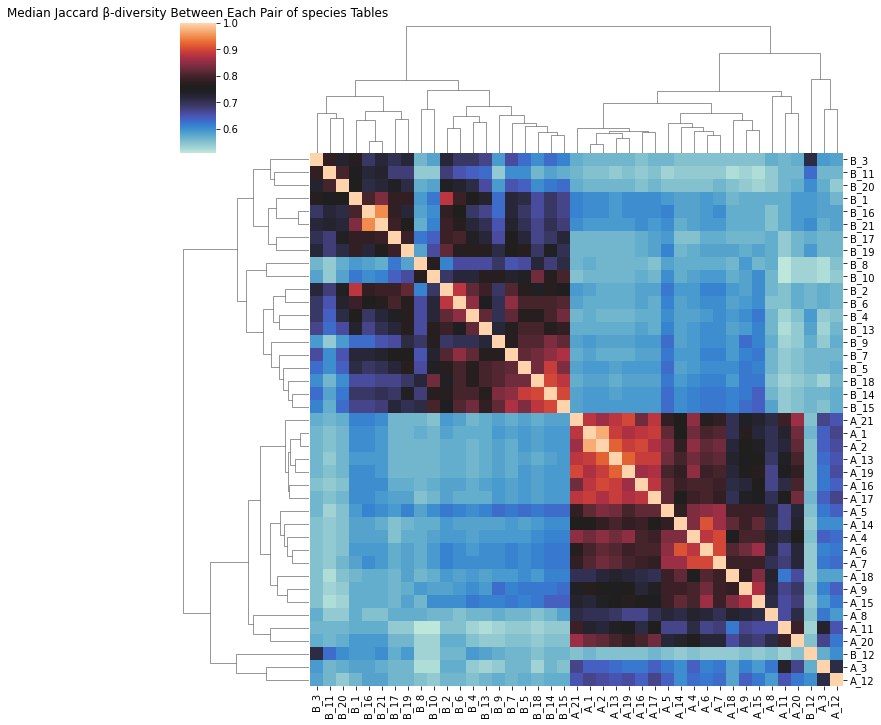

In [ ]:
compute_median_diversities(df_list, "jaccard", "s", 0.1)